# Máster en Ciencia de Datos
# Minería de Datos
## Práctica 1. Análisis de datos exploratorio

## Descripción
Datos horarios de calidad del aire de las Estaciones de la Red de Vigilancia de la ciudad de Valencia desde 2016. Estaciones: Av. Francia, Bulevar Sur, Molí del Sol, Pista...

Fuente base: [datos.gob.es](https://datos.gob.es/es/catalogo)
Fuente: [datos.gob.es](https://opendata-valencia.iotplatform.telefonica.com/dataset/hourly-air-quality-data-since-2016/resource/4be7248b-9597-4017-89af-82a9b6e2382f)



El conjunto de datos a analizar está compuesto por las siguientes características:
##Diccionario de datos
 `Columna`	Tipo	Etiqueta	Descripción
- `Fecha`	timestamp
- `Día de la semana`	text
- `Día del mes`	numeric
- `Hora`	text
- `Estación`	text
- `PM1`	text		partículas sólidas de sustancias químicas orgánicas, polvo, hollín y metales suspendidas en el aire y cuyo diámetro aerodinámico es menor que 1 µm.
- `PM2.5`	numeric	partículas sólidas de sustancias químicas orgánicas, polvo, hollín y metales suspendidas en el aire y cuyo diámetro aerodinámico es menor que 2.5 µm.
- `PM10`	numeric		partículas sólidas de sustancias químicas orgánicas, polvo, hollín y metales suspendidas en el aire y cuyo diámetro aerodinámico es menor que 10 µm.
- `NO`	numeric		concentración de óxido de nitrógeno en partes por millón (ppm).
- `NO2`	numeric		concentración de dióxido de nitrógeno en partes por millón (ppm).
- `NOx`	numeric		concentración de óxidos de nitrógeno de forma genérica en partes por millón (ppm).
- `O3`	numeric		concentración de ozono troposférico en partes por millón (ppm).
- `SO2`	numeric		concentración de dióxido de azufre en partes por millón (ppm).
- `CO`	numeric		concentración de monóxido de carbono en partes por millón (ppm).
- `Velocidad del viento`	numeric
- `Dirección del viento`	numeric
- `NH3`	text		concentración de amoníaco en partes por millón (ppm).
- `C7H8`	text		concentración de tolueno en partes por millón (ppm).
- `C6H6`	text		concentración de benceno en partes por millón (ppm).
- `Ruido`	text		 nivel de intensidad acústica en decibelios (dB).
- `C8H10`	text		concentración de etilbenceno en partes por millón (ppm).
- `Temperatura`	numeric		 temperatura en grados Celsius (ºC).
- `Humedad relativa`	numeric		por %
- `Presión`	numeric		presión atmosférica en hectopascales (hPa).
- `Radiación`	numeric		 radiación solar se mide mediante la irradiancia, cuya magnitud se expresa en W/m2.
- `Precipitación`	numeric		 cantidad de agua precipitada en un lugar y momento determinado en L/m2.
- `Velocidad máxima del viento`	numeric


## 1. Importamos las librerías necesarias

Primero, importamos las librerías que necesitaremos para realizar el procesamiento de los datos.

In [ ]:
import pandas as pd
import numpy as np #operaciones matemáticas y manejar arreglos de datos.
import matplotlib.pyplot as plt #crear gráficos y visualizaciones estáticas.
import seaborn as sns #creación de gráficos más atractivos y con estadísticas avanzadas.
import plotly.express as px #Se usa para generar gráficos interactivos fácilmente.
import plotly.graph_objects as go #gráficos más avanzados de Plotly
from plotly.subplots import make_subplots #subplots (subgráficos) en una figura.
import plotly.io as pio #Plotly para configurar y guardar gráficos.
from plotly import tools
import statsmodels.api as sm #biblioteca para análisis estadístico y modelado
from scipy import stats #pruebas estadísticas y distribuciones.
from sklearn.impute import KNNImputer #KNNImputer de scikit-learn, que se utiliza para rellenar valores faltantes en un conjunto de datos mediante el algoritmo K-Nearest Neighbors.
from datetime import datetime #datetime del módulo estándar de Python para manejar fechas y horas.
from statsmodels.tsa.seasonal import seasonal_decompose #seasonal_decompose de statsmodels  útil para descomponer series de tiempo en componentes como tendencia, estacionalidad y residuales.

%matplotlib inline

### 2. Creamos una plantilla

En este punto se ha creado una plantilla de estilos que se empleará para todas las representaciones gráficas.

In [ ]:
pio.templates["Tema"] = go.layout.Template(
   layout = {

        'title':
            {'font': {'size':30 }, "x":0.5 #título del gráfico con un tamaño de 30 y lo centra horizontalmente ("x": 0.5).
            },
        'font': { 'size':18} #tamaño de la fuente
    },
    # DATA
    data = {
        # Each graph object must be in a tuple or list for each trace
        'bar': [go.Bar(texttemplate = '%{value:.2s}', #texto que muestra el valor en cada barra.
                       textposition='outside', #valores fuera de las barras.
                       textfont={'size': 23  } #tamaño de la fuente del texto al valor 23.
                       )]
    }
)

pio.templates.default = "plotly_white+Tema" #Combina el tema predefinido de Plotly llamado "plotly_white" con el tema personalizado "Tema".

colores = ["#58bf92","#0c5917","#2fbaaf","#ad2234","#899D78","#adc244","#4d5294","#dd5234","#9d3254","#56bf89","#845550"]

### 3. Importamos los datos

Leemos el archivo CSV del [portal de datos abiertos](https://opendata-valencia.iotplatform.telefonica.com/) de la ciudad de Valencia, cargamos los datos en el DataFrame `df`, y mostramos las primeras 5 filas del DataFrame mediante la función `head()`.

In [ ]:
df = pd.read_csv('https://opendata.vlci.valencia.es/dataset/b5c2656c-6c1c-413d-a56e-549e52220502/resource/4be7248b-9597-4017-89af-82a9b6e2382f/download/rvvcca.-datos-horarios-valencia-2016-2021-curt-cas.csv', encoding='latin-1')
#The encoding argument is added to pd.read_csv to specify the correct encoding of the file, which in this case is 'latin-1' (also known as 'iso-8859-1'). This ensures that the parser can correctly interpret the characters in the file and avoid the UnicodeDecodeError.
df.head()

,Fecha,Día de la semana,Día del mes,Hora,Estación,PM1,PM2.5,PM10,NO,NO2,...,C7H8,C6H6,Ruido,C8H10,Temperatura,Humedad relativa,Presión,Radiación,Precipitación,Velocidad máxima del viento
0,01/01/2020,Miércoles,1,0:00:00,Avda. Francia,NaN,77.0,83.0,16.0,45.0,...,NaN,NaN,NaN,NaN,6.6,89.0,1019.0,0.0,0.0,3.2
1,01/01/2020,Miércoles,1,1:00:00,Avda. Francia,NaN,65.0,70.0,20.0,37.0,...,NaN,NaN,NaN,NaN,6.2,89.0,1019.0,0.0,0.0,4.2
2,01/01/2020,Miércoles,1,2:00:00,Avda. Francia,NaN,47.0,51.0,16.0,35.0,...,NaN,NaN,NaN,NaN,5.9,90.0,1019.0,0.0,0.0,4.1
3,01/01/2020,Miércoles,1,3:00:00,Avda. Francia,NaN,43.0,46.0,16.0,29.0,...,NaN,NaN,NaN,NaN,5.5,90.0,1019.0,0.0,0.0,4.1
4,01/01/2020,Miércoles,1,4:00:00,Avda. Francia,NaN,36.0,39.0,10.0,23.0,...,NaN,NaN,NaN,NaN,5.3,89.0,1018.0,0.0,0.0,3.8


Tras visualizar los datos, vemos que la columna `Fecha` empieza desde el año 2020 y no desde el año 2016 como se indicaba en el portal de [datos.gob.es](https://datos.gob.es/es/). Esto es debido a que los datos no están ordenados correctamente. Para corregirlo, procedemos a ordenar los datos por la columna `Fecha` de forma ascendente.

In [ ]:
# Ordenamos los datos por la columna Fecha de forma ascendente
df = df.sort_values(by='Fecha')

# Reseteamos los índices del DataFrame
df.reset_index(drop=True, inplace=True)

# Nos guardamos el data frame con la información en bruto
dfRaw = df

# Mostramos parte de los datos ordenados
dfRaw.head()

,Fecha,Día de la semana,Día del mes,Hora,Estación,PM1,PM2.5,PM10,NO,NO2,...,C7H8,C6H6,Ruido,C8H10,Temperatura,Humedad relativa,Presión,Radiación,Precipitación,Velocidad máxima del viento
0,01/01/2016,Viernes,1,23:00:00,Politécnico,20.0,22.0,24.0,18.0,89.0,...,NaN,NaN,NaN,NaN,13.2,86.0,1006.0,0.0,0.0,1.5
1,01/01/2016,Viernes,1,12:00:00,Consellería Meteo,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,16.0,65.0,1011.0,346.0,0.0,0.7
2,01/01/2016,Viernes,1,13:00:00,Consellería Meteo,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,16.1,67.0,1010.0,365.0,0.0,2.6
3,01/01/2016,Viernes,1,9:00:00,Pista Silla,9.0,11.0,13.0,3.0,25.0,...,2.8,1.6,59.0,1.4,13.0,74.0,1012.0,67.0,0.0,0.8
4,01/01/2016,Viernes,1,10:00:00,Pista Silla,5.0,8.0,11.0,3.0,21.0,...,1.9,0.8,60.0,1.2,13.4,74.0,1013.0,122.0,0.0,0.5


### 4. Dimensiones de los datos

Tras cargar el archivo CSV y visualizarlo, empleamos la propiedad `shape` para obtener el número de instancias y de características de los datos.

In [ ]:
print("Dimensiones:", df.shape)
print("Número de instancias:", df.shape[0])
print("Número de características:", df.shape[1])

Dimensiones: (449026, 27)
Número de instancias: 449026
Número de características: 27


### 5. Tipos de datos

En este punto analizamos el tipo de los datos del dataset para ver la variedad que existe.

In [ ]:
tipos_datos = df.dtypes.value_counts() #cuántas columnas corresponden a cada tipo de dato usando el método
tipos_datos = tipos_datos.sort_index() #Ordena los resultados por el índice de los tipos de datos para que aparezcan en un orden lógico.
labels = tipos_datos.index.astype(str).tolist() #Convierte los índices de los tipos de datos a cadenas de texto (str) y los guarda en una lista (tolist). Estos serán los nombres de las categorías que se mostrarán en el gráfico.
values = tipos_datos.tolist() #Convierte los valores (la cantidad de cada tipo de dato) a una lista.
fig = px.pie(names=labels, values=values,title="Tipos de datos: object es el más común",color_discrete_sequence=colores)
#names=labels: Especifica las etiquetas para las categorías.
#values=values: Define los valores numéricos para cada categoría.
#title: Establece un título para el gráfico.
#color_discrete_sequence=colores: Asigna colores personalizados definidos previamente en la lista colores.
fig.update_layout(legend_title_text='Tipo') #Modifica el diseño del gráfico y establece el texto del título
fig.show()

Como se observa en el gráfico sectorial, los tipos de datos existentes son 3: `int64`, `float64` y `object`.

Viendo estos datos llama la atención que, habiendo tantas columnas con valores numéricos, el porcentaje total de estas sólo represente un 14.7% del total. Esto hace que nos planteemos que, probablemente, haya columnas cuyos tipos de datos no sean correctos. Para cerciorarnos de ello, empleamos la propiedad `dtypes` para analizar los tipos de las distintas columnas.

In [ ]:
df.dtypes

,0
Fecha,object
Día de la semana,object
Día del mes,int64
Hora,object
Estación,object
PM1,float64
PM2.5,float64
PM10,float64
NO,float64
NO2,float64


#### 5.1. Conversión de tipos de las columnas

Tras mostrar los tipos de datos de las columnas con la propiedad `dtypes`, hemos descubierto que la mayoría de las columnas con valores numéricos son de tipo `object`, lo cual no nos permite obtener datos estadísticos mediante la función `describe()`. Para resolver esto, debemos convertir los tipos de datos de estas columnas al tipo apropiado.

In [ ]:
def cols_to_numeric(cols):
    """
    Esta función recibe una lista con los nombres de las columnas
    y las convierte de tipo object a tipo numérico.
    """
    for col in cols:
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Lista de columnas a las que no queremos cambiar el tipo
same_cols = ['Fecha','Día de la semana','Hora', 'Estación']

# Creamos una lista con las columnas que no están en la lista anterior.
# Estas columnas son a las que sí que les queremos cambiar el tipo
change_cols = df.loc[:, ~df.columns.isin(same_cols)].columns.tolist()

# Cambiamos el tipo de las columnas de la lista change_cols
cols_to_numeric(change_cols)

Después de modificar el tipo de las columnas de la lista `change_cols`, volvemos a mostrar el gráfico sectorial para ver la nueva distribución de los tipos de datos.

In [ ]:
tipos_datos = df.dtypes.value_counts()
tipos_datos = tipos_datos.sort_index()
labels = tipos_datos.index.astype(str).tolist()
values = tipos_datos.tolist()
fig = px.pie(names=labels, values=values,title="Tipos de datos: float64 es el más común",color_discrete_sequence =[colores[2],colores[1],colores[0]])
fig.update_layout(legend_title_text='Tipo')
fig.show()

Como se puede observar en el gráfico anterior, ahora el tipo de columna mayoritario es `float64` con un 81.5% de las columnas, y el tipo `object` a penas representa un 14.8%.

### 6. Datos por Estación

En este apartado se muestra la cantidad de registros que hay de cada estación. El objetivo es filtrar y quedarnos con algunas de las más frecuentes para realizar el posterior análisis de datos exploratorio.



In [ ]:
df.head()

,Fecha,Día de la semana,Día del mes,Hora,Estación,PM1,PM2.5,PM10,NO,NO2,...,C7H8,C6H6,Ruido,C8H10,Temperatura,Humedad relativa,Presión,Radiación,Precipitación,Velocidad máxima del viento
0,01/01/2016,Viernes,1,23:00:00,Politécnico,20.0,22.0,24.0,18.0,89.0,...,NaN,NaN,NaN,NaN,13.2,86.0,1006.0,0.0,0.0,1.5
1,01/01/2016,Viernes,1,12:00:00,Consellería Meteo,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,16.0,65.0,1011.0,346.0,0.0,0.7
2,01/01/2016,Viernes,1,13:00:00,Consellería Meteo,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,16.1,67.0,1010.0,365.0,0.0,2.6
3,01/01/2016,Viernes,1,9:00:00,Pista Silla,9.0,11.0,13.0,3.0,25.0,...,2.8,1.6,59.0,1.4,13.0,74.0,1012.0,67.0,0.0,0.8
4,01/01/2016,Viernes,1,10:00:00,Pista Silla,5.0,8.0,11.0,3.0,21.0,...,1.9,0.8,60.0,1.2,13.4,74.0,1013.0,122.0,0.0,0.5


In [ ]:
# Cambiar para mostrar la proporción
estaciones = np.round(df.Estación.value_counts() / len(df) * 100, 2) #Calcula la proporción de datos para cada estación como un porcentaje (redondeado a 2 decimales).
labels = estaciones.index.tolist() #etiquetas de las estaciones como una lista
values = estaciones.tolist()

fig = go.Figure() #creacion de una figura vacia.
fig.add_trace(go.Bar( ##gráfico de barras horizontal.
    y=labels,
    x=values,
    orientation='h', #barras sean horizontales
    marker=dict(color=colores)))

fig.update_traces(texttemplate=values)

fig.update_layout(
    title_text="Estaciones con las que tienen mayor cantidad de datos",
    xaxis_title="%",
    yaxis_title="Estación",
    barmode='stack',
    yaxis = dict(autorange="reversed"), #Invierte el orden del eje Y, para que la estación con mayor proporción aparezca en la parte superior.
)

fig.show()

Gracias al gráfico de barras obtenido podemos distinguir, de una forma más visual, la proporción de datos que tiene cada una de las estaciones. El número de este es cambiante, ya bien sea porque hay estaciones que no miden ciertos tipos de componentes (como podría ser el 'NO') o porque los sistemas de medición se instalaron más tarde, dando así lugar a valores nulos `NaN`.

Con esto observamos que las estaciones que cuentan con una mayor proporción de datos son: estaciones concentran 11.72%. Es por esto que hemos decidido utilizar estas estaciones para realizar el estudio de la evolución de la contaminación en la ciudad de Valencia.

In [ ]:
df_Viveros = df[df.Estación == 'Viveros']
df_Silla = df[df.Estación == 'Pista Silla']
df_Politécnico = df[df.Estación == 'Politécnico']
df_AvdaFrancia = df[df.Estación == 'Avda. Francia']

### 7. Análisis de valores ausentes

#### 7.1. Propoción de valores no nulos

In [ ]:
nulosV = (df_Viveros.count()/len(df_Viveros)*100)[7:] #Calcula el porcentaje de valores no nulos en cada columna del DataFrame df_Viveros
labels = nulosV.index.tolist()
values = nulosV.tolist()

fig = go.Figure(data=[go.Bar(x=labels, y=values, marker=dict(color=["#dd5234","#dd5234","#2fbaaf","#2fbaaf","#2fbaaf","#2fbaaf","#2fbaaf","#2fbaaf","#dd5234","#dd5234","#dd5234","#dd5234","#2fbaaf","#dd5234","#dd5234","#dd5234","#dd5234","#dd5234","#dd5234","#dd5234","#dd5234","#dd5234","#dd5234"]))])

fig.update_layout(title_text="Valores no nulos de la estación Viveros",yaxis_title="% No nulos")
fig['layout']['yaxis1'].update(range=[0, 100]) #Ajusta el rango del eje Y entre 0 y 100.
fig.add_hrect(y0=0, y1=60, line_width=0, fillcolor="green", opacity=0.5) #banda horizontal (hrect) de color verde claro entre los valores de Y 0 y 60
fig.add_hline(y=60, line_width=1.5, line_color="green") #línea horizontal (hline) en el nivel del 60% para indicar un umbral.
fig.show()

In [ ]:
nulosS = (df_Silla.count()/len(df_Silla)*100)[7:]
labels = nulosS.index.tolist()
values = nulosS.tolist()

fig = go.Figure(data=[go.Bar(x=labels, y=values, marker=dict(color=["#dd5234","#dd5234","#2fbaaf","#2fbaaf","#2fbaaf","#2fbaaf","#2fbaaf","#2fbaaf","#dd5234","#dd5234","#dd5234","#dd5234","#2fbaaf","#dd5234","#dd5234","#2fbaaf","#dd5234","#2fbaaf","#2fbaaf","#2fbaaf","#dd5234","#dd5234","#dd5234"]))])

fig.update_layout(title_text="Valores no nulos de la estación Pista Silla",yaxis_title="% No nulos")
fig['layout']['yaxis1'].update(range=[0, 110])
fig.add_hrect(y0=0, y1=60, line_width=0, fillcolor="green", opacity=0.5)
fig.add_hline(y=60, line_width=1.5, line_color="green")
fig.show()

Para las estaciones más relevantes, hemos generado un gráfico de barras para saber cuáles de los componentes que miden estos sistemas de contaminación son los más importantes. Para determinarlo, se ha empleado un umbral del 60% de valores no nulos para filtrarlos. De esta forma, sólo se mantendrán aquellos componentes que superen el umbral establecido. El resto de componentes cuentan con una proporción de valores nulos mayor al 40% del total y, por tanto, no serán tenidos en cuenta para realizar el análisis.

Se pueden observar que, las variables más importantes, están formadas principalmente por: "PM10", "NO", "NO2", "O3" y "SO2".

* `PM10`: Se denomina PM10 a pequeñas partículas sólidas o líquidas de polvo, cenizas, hollín, partículas metálicas, cemento o polen, dispersas en la atmósfera. Están formadas principalmente por compuestos inorgánicos como silicatos y aluminatos, metales pesados, entre otros, y material orgánico asociado a partículas de carbono. Se forma debido a: incendios forestales; nubes de polvo; actividades industriales ;y contaminación generada por automóviles.

* `NO2`: El dióxido de nitrógeno u óxido de nitrógeno (NO2), es un compuesto químico formado por los elementos nitrógeno y oxígeno, uno de los principales contaminantes entre los varios óxidos de nitrógeno.Es un gas tóxico, irritante y precursor de la formación de partículas de nitrato. Se forma como subproducto en los procesos de combustión a altas temperaturas, como en los vehículos motorizados y las plantas eléctricas.

* `NOx`: El NOx es un término genérico que hace referencia a un grupo de gases muy reactivos (tales como el óxido nítrico (NO) y el dióxido de nitrógeno (NO2)) que contienen nitrógeno y oxígeno en diversas proporciones. En el aire ambiente exterior, el óxido nítrico (NO) emitido por los automóviles se combina con el oxígeno presente en la atmósfera por la acción de la luz solar, produciendo dióxido de nitrógeno (NO2), que es uno de los mayores contaminantes del aire, y otros NOx.

* `O3`: El ozono (O3) es un gas que desprende olor y generalmente sin coloración, a temperatura y presión ambientales,pero en grandes concentraciones puede volverse ligeramente azulado. Si se respira en grandes cantidades puede provocar una irritación en los ojos o la garganta, la cual suele pasar después de respirar aire fresco y rico en oxígeno durante algunos minutos. El ozono en altas concentraciones y por períodos prolongados tiene efectos perjudiciales para la salud. El ozono que se produce en la combustión y actividad industrial a menudo se mezcla con dióxido de nitrógeno. Es conocido este ozono como ozono malo.

* `SO2`: El dióxido de azufre, u óxido de azufre, es un óxido cuya fórmula molecular es SO2. El dióxido de azufre es el principal causante de la lluvia ácida ya que en la atmósfera es transformado en ácido sulfúrico. Es liberado en muchos procesos de combustión ya que los combustibles como el carbón, el petróleo, el diésel o el gas natural contienen ciertas cantidades de compuestos azufrados. Por estas razones se intenta eliminar estos compuestos antes de su combustión por ejemplo mediante la hidrodesulfuración en los derivados del petróleo o con lavados del gas natural haciéndolo más "dulce".

#### 7.2. Imputación de valores nulos por estación

Pasamos ahora a comprobar, de las variables que vamos a usar, qué cantidad de valores nulos contienen. Con esto, podremos saber cuál será la cantidad que deberemos imputar. Una vez obtenida, haremos uso de la función `KNNImputer`. Será la principal función para completar valores faltantes utilizando k-vecinos más cercanos. Cada muestra se imputan utilizando el valor medio de los `n_neighbors` vecinos más cercanos que se encuentran en el conjunto.

[Conceptualizacion](https://www.blog.trainindata.com/knn-imputation-of-missing-values-in-machine-learning/)


##### 7.2.1. Imputación de la estación Viveros

In [ ]:
df_Viveros.info()
df_Viveros.head()

<class 'pandas.core.frame.DataFrame'>
Index: 52608 entries, 86 to 449015
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Fecha                        52608 non-null  object 
 1   Día de la semana             52608 non-null  object 
 2   Día del mes                  52608 non-null  int64  
 3   Hora                         52608 non-null  object 
 4   Estación                     52608 non-null  object 
 5   PM1                          0 non-null      float64
 6   PM2.5                        0 non-null      float64
 7   PM10                         0 non-null      float64
 8   NO                           49254 non-null  float64
 9   NO2                          49253 non-null  float64
 10  NOx                          49253 non-null  float64
 11  O3                           51423 non-null  float64
 12  SO2                          49261 non-null  float64
 13  CO                 

,Fecha,Día de la semana,Día del mes,Hora,Estación,PM1,PM2.5,PM10,NO,NO2,...,C7H8,C6H6,Ruido,C8H10,Temperatura,Humedad relativa,Presión,Radiación,Precipitación,Velocidad máxima del viento
86,01/01/2016,Viernes,1,18:00:00,Viveros,NaN,NaN,NaN,2.0,34.0,...,NaN,NaN,NaN,NaN,14.3,84.0,1007.0,1.0,0.0,0.9
87,01/01/2016,Viernes,1,17:00:00,Viveros,NaN,NaN,NaN,4.0,42.0,...,NaN,NaN,NaN,NaN,14.7,80.0,1007.0,29.0,0.0,3.1
88,01/01/2016,Viernes,1,16:00:00,Viveros,NaN,NaN,NaN,4.0,31.0,...,NaN,NaN,NaN,NaN,15.1,76.0,1007.0,152.0,0.0,4.5
89,01/01/2016,Viernes,1,6:00:00,Viveros,NaN,NaN,NaN,5.0,23.0,...,NaN,NaN,NaN,NaN,12.8,79.0,1011.0,0.0,0.0,0.7
90,01/01/2016,Viernes,1,15:00:00,Viveros,NaN,NaN,NaN,4.0,28.0,...,NaN,NaN,NaN,NaN,16.0,69.0,1008.0,212.0,0.0,3.0


In [ ]:
# Definimos el tipo de imputación
imputerKNN = KNNImputer(n_neighbors=5, weights='uniform')
#imputar valores faltantes usando los 5 vecinos más cercanos (n_neighbors=5).
#Los vecinos tienen el mismo peso (weights='uniform), lo que significa que todos los vecinos contribuyen por igual al cálculo del valor imputado.

# Y aplicamos la imputación
#dfAux = pd.DataFrame(imputerKNN.fit_transform(df_Viveros.iloc[:, 5:12]), columns=df_Viveros.iloc[:, 5:12].columns)
#seleccionan las columnas de la 5 a la 12 de df_Viveros (asumiendo que contienen valores numéricos y faltantes).

# Obtén las columnas que existen y tienen al menos algunos valores no-NaN
numeric_cols = ['PM1','PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'O3', 'SO2']
available_cols = [col for col in numeric_cols if col in df_Viveros.columns]
df_numeric = df_Viveros[available_cols].apply(pd.to_numeric, errors='coerce')

# Filtra columnas con solo NaN
non_empty_cols = [col for col in df_numeric.columns if not df_numeric[col].isna().all()]
df_numeric = df_numeric[non_empty_cols]

# Aplica imputación
dfAux = pd.DataFrame(imputerKNN.fit_transform(df_numeric), columns=non_empty_cols)

# Reconstruye el dataframe final con solo las columnas disponibles
df = df_Viveros.iloc[:, :4].copy()
for col in non_empty_cols:
    df[col] = list(dfAux[col])
#copian las primeras tres columnas de df_Viveros (asumiendo que son necesarias para la estructura final).
#df['PM1'] = list(df_Viveros['PM1'])
#df['PM1'] = list(dfAux['PM1'])
#df['PM2.5'] = list(dfAux['PM2.5'])
#df['PM10'] = list(dfAux['PM10'])
#df['NO'] = list(dfAux['NO'])
#df['NO2'] = list(dfAux['NO2'])
#df['NOx'] = list(dfAux['NOx'])
#df['O3'] = list(dfAux['O3'])
#df['SO2'] = list(dfAux['SO2'])*/

df_ViverosLimpio = df

In [ ]:
df_ViverosLimpio.head()
df_ViverosLimpio.info()

<class 'pandas.core.frame.DataFrame'>
Index: 52608 entries, 86 to 449015
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Fecha             52608 non-null  object 
 1   Día de la semana  52608 non-null  object 
 2   Día del mes       52608 non-null  int64  
 3   Hora              52608 non-null  object 
 4   NO                52608 non-null  float64
 5   NO2               52608 non-null  float64
 6   NOx               52608 non-null  float64
 7   O3                52608 non-null  float64
 8   SO2               52608 non-null  float64
dtypes: float64(5), int64(1), object(3)
memory usage: 6.0+ MB


In [ ]:
nulosV = (df_ViverosLimpio.count()/len(df_ViverosLimpio)*100)[4:]
labels = nulosV.index.tolist()
values = nulosV.tolist()

fig = go.Figure(data=[go.Bar(x=labels, y=values, marker=dict(color=["#2fbaaf"]*6))])

fig.update_layout(title_text="Valores no nulos de la estación Viveros",yaxis_title="% No nulos")
fig['layout']['yaxis1'].update(range=[0, 100])
fig.add_hrect(y0=0, y1=60, line_width=0, fillcolor="green", opacity=0.05)
fig.add_hline(y=60, line_width=1.5, line_color="green")
fig.show()

##### 7.2.2. Imputación de la estación Pista Silla

In [ ]:
# Definimos el tipo de imputación
imputerKNN = KNNImputer(n_neighbors=5, weights='uniform')

# Y aplicamos la imputación
dfAux = pd.DataFrame(imputerKNN.fit_transform(df_Silla.iloc[:, 5:15]), columns=df_Silla.iloc[:, 5:15].columns)

df = df_Viveros.iloc[:, :4]
df['PM1'] = list(dfAux['PM1'])
df['PM10'] = list(dfAux['PM10'])
df['NO'] = list(dfAux['NO'])
df['NO2'] = list(dfAux['NO2'])
df['NOx'] = list(dfAux['NOx'])
df['O3'] = list(dfAux['O3'])
df['SO2'] = list(dfAux['SO2'])

df_SillaLimpio = df

In [ ]:
df_SillaLimpio.info()

<class 'pandas.core.frame.DataFrame'>
Index: 52608 entries, 86 to 449015
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Fecha             52608 non-null  object 
 1   Día de la semana  52608 non-null  object 
 2   Día del mes       52608 non-null  int64  
 3   Hora              52608 non-null  object 
 4   PM1               52608 non-null  float64
 5   PM10              52608 non-null  float64
 6   NO                52608 non-null  float64
 7   NO2               52608 non-null  float64
 8   NOx               52608 non-null  float64
 9   O3                52608 non-null  float64
 10  SO2               52608 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 6.8+ MB


In [ ]:
nulosV = (df_SillaLimpio.count()/len(df_SillaLimpio)*100)[3:]
labels = nulosV.index.tolist()
values = nulosV.tolist()

fig = go.Figure(data=[go.Bar(x=labels, y=values, marker=dict(color=["#2fbaaf"]*6))])

fig.update_layout(title_text="Valores no nulos de la estación Pista Silla",yaxis_title="% No nulos")
fig['layout']['yaxis1'].update(range=[0, 100])
fig.add_hrect(y0=0, y1=60, line_width=0, fillcolor="green", opacity=0.05)
fig.add_hline(y=60, line_width=1.5, line_color="green")
fig.show()

Con esto, ya tenemos las variables sin ningún valor no nulo.

### 8. Selección de características


In [ ]:
#df_ViverosLimpio.drop(['_id'], axis=1, inplace=True)
#df_SillaLimpio.drop(['_id'], axis=1, inplace=True)

### 9. Extracción de características

Observando con detenimiento nuestro dataset, podemos apreciar que las columnas `Día`, `Mes` y `Año` podrían convertirse en una sola columna que incluya las tres variables. Esto se conoce como selección de características.

In [ ]:
df_SillaLimpio.info()

<class 'pandas.core.frame.DataFrame'>
Index: 52608 entries, 86 to 449015
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Fecha             52608 non-null  object 
 1   Día de la semana  52608 non-null  object 
 2   Día del mes       52608 non-null  int64  
 3   Hora              52608 non-null  object 
 4   PM1               52608 non-null  float64
 5   PM10              52608 non-null  float64
 6   NO                52608 non-null  float64
 7   NO2               52608 non-null  float64
 8   NOx               52608 non-null  float64
 9   O3                52608 non-null  float64
 10  SO2               52608 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 6.8+ MB


In [ ]:
df = dfRaw

"""
fechas = []
parse_month = {
    'Enero': 1, 'Febrero': 2, 'Marzo': 3, 'Abril': 4, 'Mayo': 5, 'Junio': 6,
    'Julio': 7, 'Agosto': 8, 'Septiembre': 9, 'Octubre': 10, 'Noviembre': 11, 'Diciembre': 12
}
for item in range(df.index.start, df.index.stop):
    dia = str(df.Día[item])
    mes = str(parse_month[df.Mes[item]])
    año = str(df.Año[item])

    s = dia + " " + mes + " " + año
    d = datetime.strptime(s, '%d %m %Y')
    fechas.append(d)

df.insert(0, 'Nueva Fecha', fechas)  #  Inserta la nueva columna al principio del dataset
df.drop(['Año', 'Mes', 'Día', 'Fecha'], axis=1, inplace=True)  # Elimina las columnas Año, Mes, Día y Fecha
df.rename(columns={'Nueva Fecha': 'Fecha'}, inplace=True)  # Renombra la nueva columna para darle el nombre Fecha
df = df.set_index('Fecha')
dfLimpio = df
"""
df['Fecha'] = pd.to_datetime(df['Fecha'], format='%d/%m/%Y')
#Volvemos a hcer imputación con estos datos para que no haya error. No eliminar!
df_Viveros = df[df['Estación'] == 'Viveros']
df_Silla = df[df['Estación'] == 'Pista Silla']
df_Poli = df[df['Estación'] == 'Politécnico']
df_Moli = df[df['Estación'] == 'Molí del Sol']
df_Francia = df[df['Estación'] == 'Avda. Francia']
df_Bulevard = df[df['Estación'] == 'Bulevard Sud']
df_Conselleria = df[df['Estación'] == 'Consellería Meteo']
df_Centro = df[df['Estación'] == 'Valencia Centro']
df_Puerto = df[df['Estación'] == 'Puerto Valencia']
df_Nazaret = df[df['Estación'] == 'Nazaret Meteo']


df_Viveros['PM10'] = pd.to_numeric(df_Viveros['PM10'], errors='coerce')
df_Viveros['NO'] = pd.to_numeric(df_Viveros['NO'], errors='coerce')
df_Viveros['NO2'] = pd.to_numeric(df_Viveros['NO2'], errors='coerce')
df_Viveros['NOx'] = pd.to_numeric(df_Viveros['NOx'], errors='coerce')
df_Viveros['O3'] = pd.to_numeric(df_Viveros['O3'], errors='coerce')
df_Viveros['SO2'] = pd.to_numeric(df_Viveros['SO2'], errors='coerce')


# Y aplicamos la imputación
dfAux = pd.DataFrame(imputerKNN.fit_transform(df_Viveros.iloc[:, 5:11]), columns=df_Viveros.iloc[:, 5:11].columns)

df = df_Viveros.iloc[:, :]
df['PM10'] = list(dfAux['PM10'])
df['NO'] = list(dfAux['NO'])
df['NO2'] = list(dfAux['NO2'])
df['NOx'] = list(dfAux['NOx'])
df['O3'] = list(dfAux['O3'])
df['SO2'] = list(dfAux['SO2'])

df_ViverosLimpio = df
df_ViverosLimpio.drop(['_id'], axis=1, inplace=True)


df_Silla['PM10'] = pd.to_numeric(df_Silla['PM10'], errors='coerce')
df_Silla['NO'] = pd.to_numeric(df_Silla['NO'], errors='coerce')
df_Silla['NO2'] = pd.to_numeric(df_Silla['NO2'], errors='coerce')
df_Silla['NOx'] = pd.to_numeric(df_Silla['NOx'], errors='coerce')
df_Silla['O3'] = pd.to_numeric(df_Silla['O3'], errors='coerce')
df_Silla['SO2'] = pd.to_numeric(df_Silla['SO2'], errors='coerce')


# Y aplicamos la imputación
dfAux = pd.DataFrame(imputerKNN.fit_transform(df_Silla.iloc[:, 5:11]), columns=df_Silla.iloc[:, 5:11].columns)

df = df_Silla.iloc[:, :5]
df['PM10'] = list(dfAux['PM10'])
df['NO'] = list(dfAux['NO'])
df['NO2'] = list(dfAux['NO2'])
df['NOx'] = list(dfAux['NOx'])
df['O3'] = list(dfAux['O3'])
df['SO2'] = list(dfAux['SO2'])

df_SillaLimpio = df
df_SillaLimpio.drop(['_id'], axis=1, inplace=True)

<ipython-input-36-87e223595140>:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-36-87e223595140>:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-36-87e223595140>:40: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-36-87e2

KeyboardInterrupt: 

### 10. Analizar la tendencia central y la dispersión de los datos

En este apartado se analiza la tendencia central y la dispersión de los datos del conjunto.

#### 10.1. Tendencia central y dispersión de los datos de la estación de Viveros

In [ ]:
# Estadísticas descriptivas de la estación de Viveros
df_ViverosLimpio.describe()

,Día del mes,NO,NO2,NOx,O3,SO2
count,52608.000000,52608.000000,52608.000000,52608.000000,52608.000000,52608.000000
mean,15.719891,7.694022,22.306840,33.927789,53.421777,3.524469
std,8.802508,17.529822,19.056227,41.622562,29.277942,1.260075
min,1.000000,1.000000,1.000000,2.000000,1.000000,3.000000
25%,8.000000,2.000000,8.000000,12.000000,30.000000,3.000000
50%,16.000000,3.000000,17.000000,21.000000,54.000000,3.000000
75%,23.000000,5.000000,30.200000,39.000000,76.000000,4.000000
max,31.000000,393.000000,160.000000,735.000000,156.000000,28.000000


In [ ]:
print("Coeficiente de asimetría de NOx en la estación de Viveros", stats.skew(df_ViverosLimpio['NOx']))
print("Coeficiente de asimetría de O3 en la estación de Viveros", stats.skew(df_ViverosLimpio['O3']))
print("Coeficiente de asimetría de SO2 en la estación de Viveros", stats.skew(df_ViverosLimpio['SO2']))

Coeficiente de asimetría de NOx en la estación de Viveros 4.187125695393301
Coeficiente de asimetría de O3 en la estación de Viveros -0.0026405207765510396
Coeficiente de asimetría de SO2 en la estación de Viveros 4.972605340538756


In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_ViverosLimpio['O3'],name = "O3",marker_color=colores[0], opacity=0.75))
fig.add_trace(go.Histogram(x=df_ViverosLimpio['NOx'],name = "NOx",marker_color=colores[1], opacity=0.75))
fig.add_trace(go.Histogram(x=df_ViverosLimpio['SO2'],name = "SO2",marker_color=colores[2], opacity=1))

# Overlay both histograms
fig.update_layout(title_text="Histograma de las métricas de Viveros",  width=1100, height=800,bargap=0)
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.55)
fig['layout']['yaxis1'].update(range=[0, 2300])
fig['layout']['xaxis1'].update(range=[0, 200])

fig.show()

A partir del cálculo de los coeficientes de simetría anteriores, y tal y como se ve en la gráfica, podemos concluir:

- Que la columna `NoX` de la estación de Viveros es extremadamente sesgada (coeficiente > 1).
- Que la columna `O3` de la estación de Viveros es no sesgada (coeficiente entre -0.5 y 0.5).
- Que la columna `SO2` de la estación de Viveros es extremadamente sesgada (coeficiente > 1).

In [ ]:
# Valores máximos para NOx, O3 y SO2 en Viveros
print(df_Viveros.iloc[df_ViverosLimpio['NOx'].argmax()], end="\n\n")
print(df_Viveros.iloc[df_ViverosLimpio['O3'].argmax()], end="\n\n")
print(df_Viveros.iloc[df_ViverosLimpio['SO2'].argmax()], end="\n\n")

Fecha                          2016-12-12 00:00:00
Día de la semana                             Lunes
Día del mes                                     12
Hora                                      22:00:00
Estación                                   Viveros
PM1                                            NaN
PM2.5                                          NaN
PM10                                           NaN
NO                                           393.0
NO2                                          133.0
NOx                                          735.0
O3                                             5.0
SO2                                            7.0
CO                                             NaN
Velocidad del viento                           0.9
Dirección del viento                         314.0
NH3                                            NaN
C7H8                                           NaN
C6H6                                           NaN
Ruido                          

In [ ]:
# Valores mínimos para NOx, O3 y SO2 en Viveros
print(df_Viveros.iloc[df_ViverosLimpio['NOx'].argmin()], end="\n\n")
print(df_Viveros.iloc[df_ViverosLimpio['O3'].argmin()], end="\n\n")
print(df_Viveros.iloc[df_ViverosLimpio['SO2'].argmin()], end="\n\n")

Fecha                          2020-03-01 00:00:00
Día de la semana                           Domingo
Día del mes                                      1
Hora                                       4:00:00
Estación                                   Viveros
PM1                                            NaN
PM2.5                                          NaN
PM10                                           NaN
NO                                             1.0
NO2                                            1.0
NOx                                            2.0
O3                                            58.0
SO2                                            3.0
CO                                             NaN
Velocidad del viento                           4.5
Dirección del viento                         285.0
NH3                                            NaN
C7H8                                           NaN
C6H6                                           NaN
Ruido                          

In [ ]:
# Rango intercuartílico de valores de NOx
print("Rango intercuatílico de NOx:", df_ViverosLimpio['NOx'].quantile(0.75) - df_ViverosLimpio['NOx'].quantile(0.25))

# Rango intercuartílico de valores de O3
print("Rango intercuatílico de O3:", df_ViverosLimpio['O3'].quantile(0.75) - df_ViverosLimpio['O3'].quantile(0.25))

# Rango intercuartílico de valores de SO2
print("Rango intercuatílico de SO2:", df_ViverosLimpio['SO2'].quantile(0.75) - df_ViverosLimpio['SO2'].quantile(0.25))

Rango intercuatílico de NOx: 27.0
Rango intercuatílico de O3: 46.0
Rango intercuatílico de SO2: 1.0


In [ ]:
# Distribución dispar de los valores de NOx
int_NOx = pd.cut(df_ViverosLimpio.NOx, 3, precision=2)
print(int_NOx.value_counts(), end="\n\n")

# Distribución dispar de los valores de O3
int_NOx = pd.cut(df_ViverosLimpio.O3, 3, precision=2)
print(int_NOx.value_counts(), end="\n\n")

# Distribución dispar de los valores de SO2
int_NOx = pd.cut(df_ViverosLimpio.SO2, 3, precision=2)
print(int_NOx.value_counts(), end="\n\n")

NOx
(1.27, 246.33]      52282
(246.33, 490.67]      308
(490.67, 735.0]        18
Name: count, dtype: int64

O3
(52.67, 104.33]    26316
(0.84, 52.67]      24686
(104.33, 156.0]     1606
Name: count, dtype: int64

SO2
(2.98, 11.33]     52408
(11.33, 19.67]      185
(19.67, 28.0]        15
Name: count, dtype: int64



Como se puede observar en la celda anterior, los intervalos de las columnas `NOx`, `O3`, y `SO2` tienen un número de muestras muy dispar.

Como solución, se calculan unos intervalos más pequeños, de forma que el número de muestras no sea tan dispar.

In [ ]:
# Distribución de los valores de NOx menos dispar
same_data_int_NOx = pd.qcut(df_ViverosLimpio['NOx'], 3, precision=2)
print(same_data_int_NOx.value_counts(), end="\n\n")

# Distribución de los valores de O3 menos dispar
same_data_int_NOx = pd.qcut(df_ViverosLimpio['O3'], 3, precision=2)
print(same_data_int_NOx.value_counts(), end="\n\n")

# Distribución de los valores de SO2 menos dispar
same_data_int_NOx = pd.qcut(df_ViverosLimpio['SO2'], 3, precision=2, duplicates='drop') # Added duplicates='drop'
print(same_data_int_NOx.value_counts(), end="\n\n")

NOx
(1.99, 15.0]     18812
(31.0, 735.0]    17291
(15.0, 31.0]     16505
Name: count, dtype: int64

O3
(0.99, 40.0]     17888
(68.0, 156.0]    17531
(40.0, 68.0]     17189
Name: count, dtype: int64

SO2
(2.99, 28.0]    52608
Name: count, dtype: int64



In [ ]:
# Desviación media (Mean Absolute Deviation) de la estación de Viveros
print("Desviación media (Mean Absolute Deviation) de la estación de Viveros")
# Selecciona solo columnas numéricas
numeric_columns = df_ViverosLimpio.select_dtypes(include=['number'])
mad_values = numeric_columns.apply(lambda x: (x - x.mean()).abs().mean())
print(mad_values)

Desviación media (Mean Absolute Deviation) de la estación de Viveros
Día del mes     7.620622
NO              8.088794
NO2            14.625921
NOx            25.171885
O3             24.404846
SO2             0.759947
dtype: float64


In [ ]:
# Revisar los tipos de datos de cada columna
print(df_ViverosLimpio.dtypes)

Fecha                object
Día de la semana     object
Día del mes           int64
Hora                 object
NO                  float64
NO2                 float64
NOx                 float64
O3                  float64
SO2                 float64
dtype: object


In [ ]:
# Seleccionar solo las columnas numéricas antes de calcular la varianza
numeric_cols = df_ViverosLimpio.select_dtypes(include=['number'])

# Calcular la varianza solo de las columnas numéricas
print("Varianza datos de la estación de Viveros")
print(numeric_cols.var())

Varianza datos de la estación de Viveros
Día del mes      77.484143
NO              311.397020
NO2             365.012791
NOx            1745.543472
O3              857.987607
SO2               1.587411
dtype: float64


#### 10.2. Tendencia central y dispersión de los datos de la estación de Puerto Silla

In [ ]:
# Estadísticas descriptivas de la estación de Puerto Silla
df_SillaLimpio.describe()

,Fecha,Día del mes,PM10,NO,NO2,NOx,O3,SO2
count,52608,52608.000000,52608.000000,52608.000000,52608.000000,52608.000000,52608.000000,52608.000000
mean,2018-12-31 12:00:00,15.719891,21.264598,18.056916,31.055229,58.590338,46.652515,4.155162
min,2016-01-01 00:00:00,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,3.000000
25%,2017-07-01 18:00:00,8.000000,9.000000,3.000000,13.000000,19.000000,26.000000,3.000000
50%,2018-12-31 12:00:00,16.000000,15.000000,9.000000,26.000000,41.000000,48.000000,4.000000
75%,2020-07-01 06:00:00,23.000000,25.000000,21.000000,45.000000,78.000000,66.000000,4.000000
max,2021-12-31 00:00:00,31.000000,372.000000,491.000000,184.000000,936.000000,165.000000,65.000000
std,NaN,8.802508,23.846599,26.718037,22.922748,59.799666,26.367635,2.062773


In [ ]:
print("Coeficiente de asimetría de NOx en la estación de Puerto Silla", stats.skew(df_SillaLimpio['NOx']))
print("Coeficiente de asimetría de O3 en la estación de Puerto Silla", stats.skew(df_SillaLimpio['O3']))
print("Coeficiente de asimetría de SO2 en la estación de Puerto Silla", stats.skew(df_SillaLimpio['SO2']))

Coeficiente de asimetría de NOx en la estación de Puerto Silla 2.8000891333782696
Coeficiente de asimetría de O3 en la estación de Puerto Silla 0.06303932073524589
Coeficiente de asimetría de SO2 en la estación de Puerto Silla 5.409313129774805


In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_SillaLimpio['O3'],name = "O3",marker_color=colores[0], opacity=0.75))
fig.add_trace(go.Histogram(x=df_SillaLimpio['NOx'],name = "NOx",marker_color=colores[1], opacity=0.75))
fig.add_trace(go.Histogram(x=df_SillaLimpio['SO2'],name = "SO2",marker_color=colores[2], opacity=1))

# Overlay both histograms
fig.update_layout(title_text="Histograma de las métricas de Silla",  width=1100, height=800,bargap=0)
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.55)
fig['layout']['yaxis1'].update(range=[0, 2300])
fig['layout']['xaxis1'].update(range=[0, 200])

fig.show()

A partir del cálculo de los coeficientes de simetría anteriores, y tal y como se ve en la gráfica, podemos concluir:

- Que la columna `NOx` de la estación de Puerto Silla es extremadamente sesgada (coeficiente > 1).
- Que la columna `O3` de la estación de Puerto Silla es no sesgada (coeficiente entre -0.5 y 0.5).
- Que la columna `SO2` de la estación de Puerto Silla es extremadamente sesgada (coeficiente > 1).

In [ ]:
# Valores máximos para NOx, O3 y SO2 en Puerto Silla
print(df_SillaLimpio.iloc[df_SillaLimpio['NOx'].argmax()], end="\n\n")
print(df_SillaLimpio.iloc[df_SillaLimpio['O3'].argmax()], end="\n\n")
print(df_SillaLimpio.iloc[df_SillaLimpio['SO2'].argmax()], end="\n\n")

Fecha               2017-12-22 00:00:00
Día de la semana                Viernes
Día del mes                          22
PM10                              181.0
NO                                491.0
NO2                               184.0
NOx                               936.0
O3                                 11.0
SO2                                41.0
Name: 323443, dtype: object

Fecha               2018-08-05 00:00:00
Día de la semana                Domingo
Día del mes                           5
PM10                               20.0
NO                                  7.0
NO2                                29.0
NOx                                40.0
O3                                165.0
SO2                                 4.0
Name: 67905, dtype: object

Fecha               2018-03-14 00:00:00
Día de la semana              Miércoles
Día del mes                          14
PM10                              103.0
NO                                 78.0
NO2                    

In [ ]:
# Valores mínimos para NOx, O3 y SO2 en Puerto Silla
print(df_SillaLimpio.iloc[df_SillaLimpio['NOx'].argmin()], end="\n\n")
print(df_SillaLimpio.iloc[df_SillaLimpio['O3'].argmin()], end="\n\n")
print(df_SillaLimpio.iloc[df_SillaLimpio['SO2'].argmin()], end="\n\n")

In [ ]:
# Rango intercuartílico de valores de NOx
print("Rango intercuatílico de NOx:", df_SillaLimpio['NOx'].quantile(0.75) - df_SillaLimpio['NOx'].quantile(0.25))

# Rango intercuartílico de valores de O3
print("Rango intercuatílico de O3:", df_SillaLimpio['O3'].quantile(0.75) - df_SillaLimpio['O3'].quantile(0.25))

# Rango intercuartílico de valores de SO2
print("Rango intercuatílico de SO2:", df_SillaLimpio['SO2'].quantile(0.75) - df_SillaLimpio['SO2'].quantile(0.25))

In [ ]:
# Distribución dispar de los valores de NOx
int_NOx = pd.cut(df_SillaLimpio.NOx, 3, precision=2)
print(int_NOx.value_counts(), end="\n\n")

# Distribución dispar de los valores de O3
int_NOx = pd.cut(df_SillaLimpio.O3, 3, precision=2)
print(int_NOx.value_counts(), end="\n\n")

# Distribución dispar de los valores de SO2 sin normalizar
int_NOx = pd.cut(df_SillaLimpio.SO2, 3, precision=2)
print(int_NOx.value_counts(), end="\n\n")

Como se puede observar en la celda anterior, los intervalos de las columnas `NOx`, `O3`, y `SO2` tienen un número de muestras muy dispar.

Como solución, se calculan unos intervalos más pequeños, de forma que el número de muestras no sea tan dispar.

In [ ]:
# Distribución de los valores de NOx normalizados
same_data_int_NOx = pd.qcut(df_SillaLimpio['NOx'], 3, precision=2)
print(same_data_int_NOx.value_counts(), end="\n\n")

# Distribución de los valores de O3 normalizados
same_data_int_NOx = pd.qcut(df_SillaLimpio['O3'], 3, precision=2)
print(same_data_int_NOx.value_counts(), end="\n\n")

# Distribución de los valores de SO2 normalizados
same_data_int_NOx = pd.qcut(df_SillaLimpio['SO2'], 3, precision=2)
print(same_data_int_NOx.value_counts(), end="\n\n")

In [ ]:
# Desviación media (Mean Absolute Deviation)
# Distancia promedio entre cada punto y la media
print("Desviación media (Mean Absolute Deviation) de la estación de Puerto Silla")
df_SillaLimpio.mad()

In [ ]:
print("Varianza datos de la estación de Puerto Silla")
df_SillaLimpio.var()

### 11. Analizar la dispersión de los datos


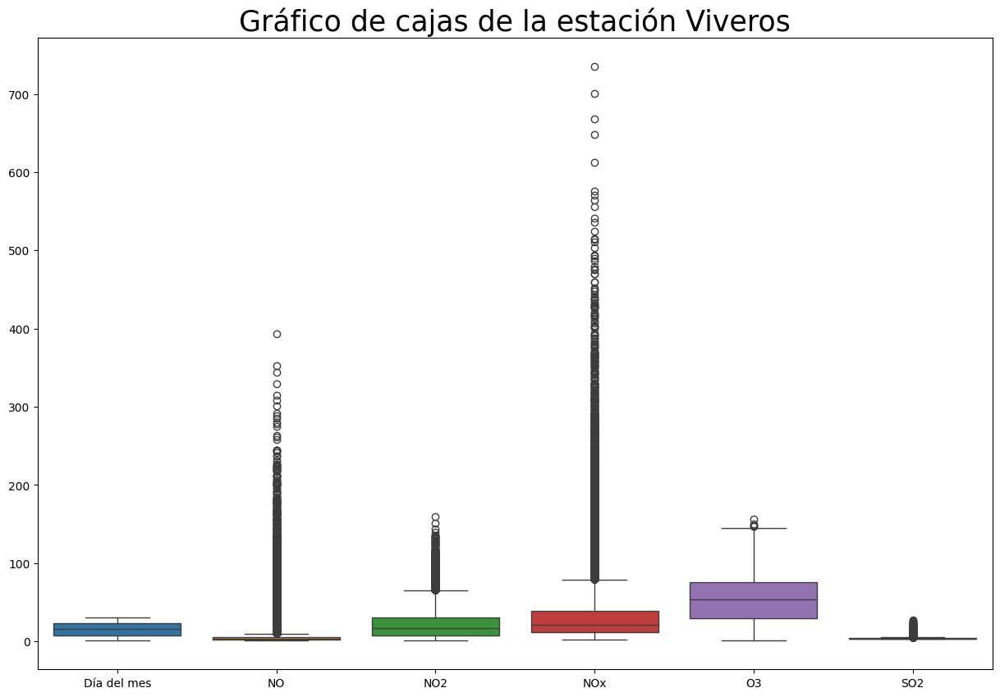

In [ ]:
plt.figure(figsize=(15, 10))
ax = sns.boxplot(data=df_ViverosLimpio.iloc[:, 2:9])
ax.axes.set_title("Gráfico de cajas de la estación Viveros",fontsize=25)
plt.show()

In [ ]:
plt.figure(figsize=(15, 10))
ax = sns.boxplot(data=df_SillaLimpio.iloc[:, 2:9])
ax.axes.set_title("Gráfico de cajas de la estación Viveros",fontsize=25)
plt.show()

Podemos ver que dado que todas la variables analizadas se miden en la misma unidad, partes por millon (ppm), se tienen valores en rangos similares. La métrica que más llama la atención es `NOx` que tiene un rango intercuartílico más grande y una mayor cantidad de outliers. Esto tiene sentido si consideramos que esta variable representa la suma de todos los tipos diferentes de óxidos de nitrógeno y por tanto es normal que haya más variabilidad.

### 12. Análisis de series temporales




#### Analisis de estacionalidad de la métrica O3

In [ ]:
sdViveros = seasonal_decompose(df_ViverosLimpio['O3'], model='additive', period=365)
sdSilla = seasonal_decompose(df_SillaLimpio['O3'], model='additive', period=365)

In [ ]:
fig = make_subplots(rows=4, cols=1, subplot_titles=("Observación", "Estacional","Tendencia","Residuo"),shared_xaxes=True)

#Añadimos observacion
linesViveros = go.Scatter(
    x = sdViveros.observed.index,
    y = sdViveros.observed,
    mode = 'lines',
    name = 'Viveros',
    marker=dict( color=colores[0]),
    legendgroup = '1'
)

linesSilla = go.Scatter(
    x = sdSilla.observed.index,
    y = sdSilla.observed,
    mode = 'lines',
    name = 'Pista Silla',
    marker=dict( color=colores[1]),
    legendgroup = '2'
)

#Adding traces
fig.add_trace(linesViveros, row=1, col=1)
fig.add_trace(linesSilla, row=1, col=1)

#Añadimos estacional
linesViveros = go.Scatter(
    x = sdViveros.seasonal.index,
    y = sdViveros.seasonal,
    mode = 'lines',
    name = 'Viveros',
    marker=dict( color=colores[0]),
    legendgroup = '1',
    showlegend=False
)

#Lines + markers mode
linesSilla = go.Scatter(
    x = sdSilla.seasonal.index,
    y = sdSilla.seasonal,
    mode = 'lines',
    name = 'Pista Silla',
    marker=dict( color=colores[1]),
    legendgroup = '2',
    showlegend=False
)

#Adding traces
fig.add_trace(linesViveros, row=2, col=1)
fig.add_trace(linesSilla, row=2, col=1)

#Añadimos estacional
linesViveros = go.Scatter(
    x = sdViveros.trend.index,
    y = sdViveros.trend,
    mode = 'lines',
    name = 'Viveros',
    marker=dict( color=colores[0]),
    legendgroup = '1',
    showlegend=False
)

#Lines + markers mode
linesSilla = go.Scatter(
    x = sdSilla.trend.index,
    y = sdSilla.trend,
    mode = 'lines',
    name = 'Pista Silla',
    marker=dict( color=colores[1]),
    legendgroup = '2',
    showlegend=False
)

#Adding traces
fig.add_trace(linesViveros, row=3, col=1)
fig.add_trace(linesSilla, row=3, col=1)

#Añadimos estacional
linesViveros = go.Scatter(
    x = sdViveros.resid.index,
    y = sdViveros.resid,
    mode = 'lines',
    name = 'Viveros',
    marker=dict( color=colores[0]),
    legendgroup = '1',
    showlegend=False
)

#Lines + markers mode
linesSilla = go.Scatter(
    x = sdSilla.resid.index,
    y = sdSilla.resid,
    mode = 'lines',
    name = 'Pista Silla',
    marker=dict( color=colores[1]),
    legendgroup = '2',
    showlegend=False
)

#Adding traces
fig.add_trace(linesViveros, row=4, col=1)
fig.add_trace(linesSilla, row=4, col=1)

fig.update_layout(title_text="Descomposición estacional de la métrica O3",  width=1100, height=800)
#Create the plot
fig.show()

El análisis de estacionalidad es una de las herramientas más importantes que tenemos para interpretar las series temporales. Vamos ha analizar la variable `O3`. Ya a simple vista podemos ver que hay un patrón de estacionalidad en los datos. Si nos fijamos en la gráfica de la estacionalidad nos queda claro que se sigue un ciclo anual, donde los valores son bajos en invierno y altos en verano. Para poder ver la evolución a largo plazo tenemos el estudio de la tendencia. En el caso de esta variable la tendencia es clara, Desde 2004 no ha dejado de aumentar (aunque tenga algun més a la baja), tanto para la estación de Viveros como para la de Silla.

Como tenemos datos de 2020, podemos ver claramente como durante los primeros meses de la pandemia la concentración de este gas disminuyó produciendo una tendencia a la baja.

#### Analisis de estacionalidad de la métrica NOx

In [ ]:
sdViveros = seasonal_decompose(df_ViverosLimpio['NOx'], model='additive', period=365)
sdSilla = seasonal_decompose(df_SillaLimpio['NOx'], model='additive', period=365)

In [ ]:
fig = make_subplots(rows=4, cols=1, subplot_titles=("Observación", "Estacional","Tendencia","Residuo"),shared_xaxes=True)

#Añadimos observacion
linesViveros = go.Scatter(
    x = sdViveros.observed.index,
    y = sdViveros.observed,
    mode = 'lines',
    name = 'Viveros',
    marker=dict( color=colores[0]),
    legendgroup = '1'
)

linesSilla = go.Scatter(
    x = sdSilla.observed.index,
    y = sdSilla.observed,
    mode = 'lines',
    name = 'Pista Silla',
    marker=dict( color=colores[1]),
    legendgroup = '2'
)

#Adding traces
fig.add_trace(linesViveros, row=1, col=1)
fig.add_trace(linesSilla, row=1, col=1)

#Añadimos estacional
linesViveros = go.Scatter(
    x = sdViveros.seasonal.index,
    y = sdViveros.seasonal,
    mode = 'lines',
    name = 'Viveros',
    marker=dict( color=colores[0]),
    legendgroup = '1',
    showlegend=False
)

#Lines + markers mode
linesSilla = go.Scatter(
    x = sdSilla.seasonal.index,
    y = sdSilla.seasonal,
    mode = 'lines',
    name = 'Pista Silla',
    marker=dict( color=colores[1]),
    legendgroup = '2',
    showlegend=False
)

#Adding traces
fig.add_trace(linesViveros, row=2, col=1)
fig.add_trace(linesSilla, row=2, col=1)

#Añadimos estacional
linesViveros = go.Scatter(
    x = sdViveros.trend.index,
    y = sdViveros.trend,
    mode = 'lines',
    name = 'Viveros',
    marker=dict( color=colores[0]),
    legendgroup = '1',
    showlegend=False
)

#Lines + markers mode
linesSilla = go.Scatter(
    x = sdSilla.trend.index,
    y = sdSilla.trend,
    mode = 'lines',
    name = 'Pista Silla',
    marker=dict( color=colores[1]),
    legendgroup = '2',
    showlegend=False
)

#Adding traces
fig.add_trace(linesViveros, row=3, col=1)
fig.add_trace(linesSilla, row=3, col=1)

#Añadimos estacional
linesViveros = go.Scatter(
    x = sdViveros.resid.index,
    y = sdViveros.resid,
    mode = 'lines',
    name = 'Viveros',
    marker=dict( color=colores[0]),
    legendgroup = '1',
    showlegend=False
)

#Lines + markers mode
linesSilla = go.Scatter(
    x = sdSilla.resid.index,
    y = sdSilla.resid,
    mode = 'lines',
    name = 'Pista Silla',
    marker=dict( color=colores[1]),
    legendgroup = '2',
    showlegend=False
)

#Adding traces
fig.add_trace(linesViveros, row=4, col=1)
fig.add_trace(linesSilla, row=4, col=1)

fig.update_layout(title_text="Descomposición estacional de la métrica NOx",  width=1100, height=800)
#Create the plot
fig.show()

En el caso de este componente no es tan claro el patrón que sigue a simple vista. Si miramos la gráfica estacional si se ve como los valores tienen un pico máximo en invierno, sobre diciembre o enero, y valores mínimos en los meses de verano. La tendencia nos sugiere que la concentración está bajando ligeramente con el paso de los años. Los residuos de está métrica son muy variables.

Un aspecto muy reelevante que se ha notado al comparar ambas estaciones es que debido a la situación geográfica de estas, los valores en la estación de Viveros son mucho más contínuos y estables, mientras que en la estación de Silla son mucho más heterogéneos, cosa lógica pues esta estación está ubicada cerca de una circunvalación donde el tráfico es muy variable.

In [ ]:
fig = make_subplots(rows=2, cols=1, subplot_titles=("Viveros", "Pista Silla"),shared_xaxes=True)

#VIVEROS
sdViveros = seasonal_decompose(df_ViverosLimpio['O3'], model='additive', period=365)
lines = go.Scatter(
    x = sdViveros.trend.index,
    y = sdViveros.trend,
    mode = 'lines',
    name = 'O3',
    marker=dict( color=colores[0]),
    legendgroup = '1'
)
#Adding traces
fig.add_trace(lines, row=1, col=1)

sdViveros = seasonal_decompose(df_ViverosLimpio['NOx'], model='additive', period=365)
lines = go.Scatter(
    x = sdViveros.trend.index,
    y = sdViveros.trend,
    mode = 'lines',
    name = 'NOx',
    marker=dict( color=colores[1]),

    legendgroup = '2'
)
fig.add_trace(lines, row=1, col=1)

sdViveros = seasonal_decompose(df_ViverosLimpio['SO2'], model='additive', period=365)
#Añadimos estacional
lines = go.Scatter(
    x = sdViveros.trend.index,
    y = sdViveros.trend,
    mode = 'lines',
    name = 'SO2',
    marker=dict( color=colores[2]),
    legendgroup = '3'
)
fig.add_trace(lines, row=1, col=1)

sdViveros = seasonal_decompose(df_ViverosLimpio['PM10'], model='additive', period=365)
lines = go.Scatter(
    x = sdViveros.trend.index,
    y = sdViveros.trend,
    mode = 'lines',
    name = 'PM10',
    marker=dict( color=colores[3]),
    legendgroup = '4'

)
fig.add_trace(lines, row=1, col=1)

#SILLA

sdSilla = seasonal_decompose(df_ViverosLimpio['O3'], model='additive', period=365)
lines = go.Scatter(
    x = sdSilla.trend.index,
    y = sdSilla.trend,
    mode = 'lines',
    name = 'O3',
    marker=dict( color=colores[0]),
    legendgroup = '1',
    showlegend=False
)
fig.add_trace(lines, row=2, col=1)

sdSilla = seasonal_decompose(df_ViverosLimpio['NO2'], model='additive', period=365)
lines = go.Scatter(
    x = sdSilla.trend.index,
    y = sdSilla.trend,
    mode = 'lines',
    name = 'NO2',
    marker=dict( color=colores[1]),
    legendgroup = '2',
    showlegend=False
)
fig.add_trace(lines, row=2, col=1)

sdSilla = seasonal_decompose(df_ViverosLimpio['SO2'], model='additive', period=365)
lines = go.Scatter(
    x = sdSilla.trend.index,
    y = sdSilla.trend,
    mode = 'lines',
    name = 'SO2',
    marker=dict( color=colores[2]),
    legendgroup = '3',
    showlegend=False
)
fig.add_trace(lines, row=2, col=1)

sdSilla = seasonal_decompose(df_ViverosLimpio['PM10'], model='additive', period=365)

lines = go.Scatter(
    x = sdSilla.trend.index,
    y = sdSilla.trend,
    mode = 'lines',
    name = 'PM10',
    marker=dict( color=colores[3]),
    legendgroup = '4',
    showlegend=False
)
fig.add_trace(lines, row=2, col=1)

fig.update_layout(title_text="Descomposición estacional de la métrica NOx",  width=1100, height=800)
#Create the plot
fig.show()

Viendo todas las métricas juntas la principal conclusión que podemos sacar es que las métricas `O3` y `NOx` tienen una relación inversamente proporcional, pues cuando una aumenta la otra disminuye. Por otro lado, `SO2` no tiene una tendencía clara y no parece depender del resto de métricas, pues no existe un patrón observado.

### 13. Otras métricas y/o visualizaciones


#### Pairplots de las métricas seleccionadas

In [ ]:
plt.figure(figsize=(20,10))
plt.rcParams['text.color'] = '#113'
plt.rcParams['xtick.color'] = '#113'
plt.rcParams['ytick.color'] = '#113'
plt.rcParams['axes.labelcolor'] = '#113'
plt.rcParams['xtick.labelsize'] = 13
plt.rcParams['ytick.labelsize'] = 13


g = sns.pairplot(data=df_Viveros[['NO2', 'NOx', 'O3', 'SO2','PM10']], diag_kind='hist', hue='O3')
g.fig.suptitle("Métrica 03 de Viveros",fontsize=25, y=1.05)
plt.show()


g = sns.pairplot(data=df_Silla[['NO2', 'NOx', 'O3', 'SO2','PM10']], diag_kind='hist', hue='O3')
g.fig.suptitle("Métrica 03 de Silla",fontsize=25, y=1.05)
plt.show()

#### Pairplots de la métrica O3

Contemplamos en ambos pairplots que la relación de O3 con el resto de métricas sigue una tendencia positiva, especialmente en el caso de los NO2 con NOx. En todos estos tipos de gases, la relación será directa.

Las distribuciones en ambas estaciones siguen una forma similar, y la relación cuenta con valores muy parejos.

KeyboardInterrupt: 

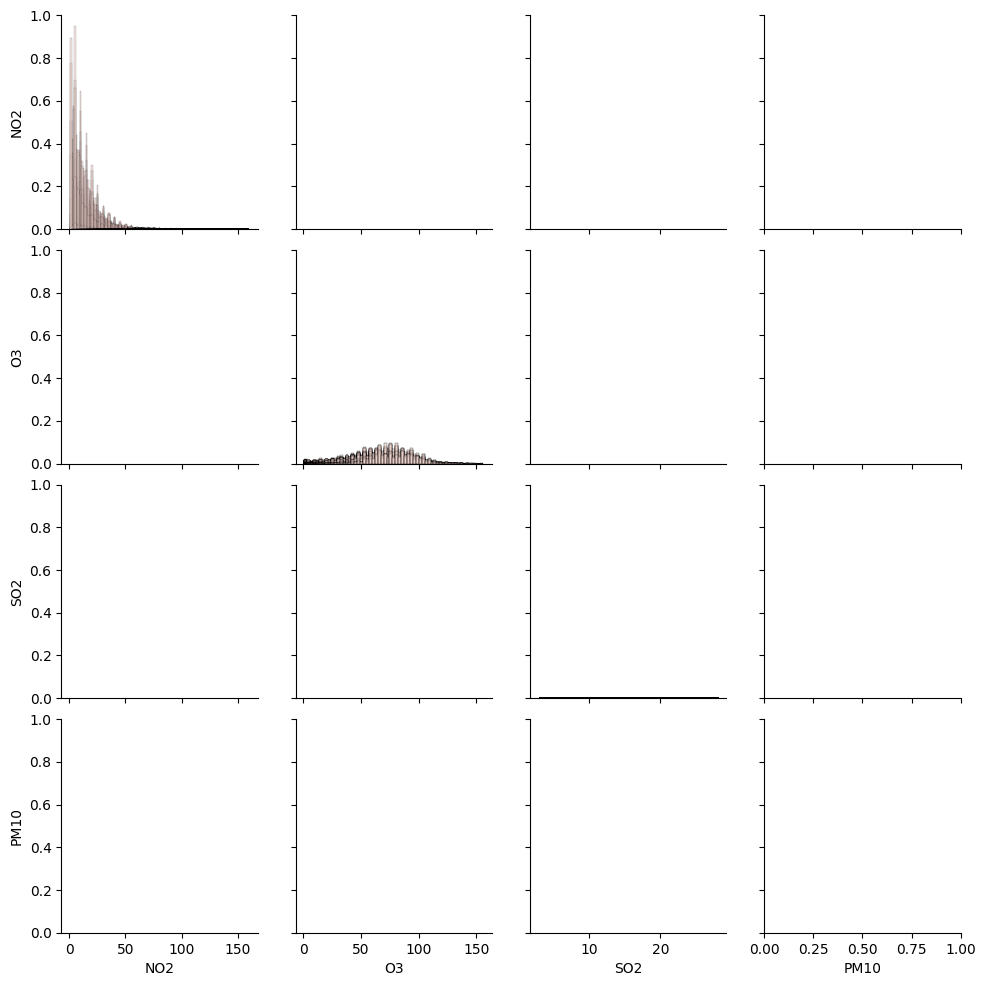

In [ ]:
g = sns.pairplot(data=df_Viveros[['NO2', 'NOx', 'O3', 'SO2','PM10']], diag_kind='hist', hue='NOx')
g.fig.suptitle("Métrica NOx de Viveros",fontsize=25, y=1.05)
plt.show()


g = sns.pairplot(data=df_Silla[['NO2', 'NOx', 'O3', 'SO2','PM10']], diag_kind='hist', hue='NOx')
g.fig.suptitle("Métrica NOx de Silla",fontsize=25, y=1.05)
plt.show()

#### Pairplots NOx

Pasando ahora al caso de NOx, las tendencias con el resto de métricas son positivas, exceptuando el caso de la relación O3 y NO2. Gracias a esto podremos deducir que la relación será inversamente proporcional en los valores.

Si que es cierto que el número de valores de NOx es muy superior al de O3, llegando a un máximo de 400 frente a 100 en el caso de la métrica anteriro

#### Mapas de calor de la variable O3

In [ ]:
monthlyViveros = pd.pivot_table(data=df_Viveros, values='O3', index=df_Viveros.index.month_name(), columns=df_Viveros.index.year)
monthlyViveros = monthlyViveros.reindex(index=['January', 'February', 'March', 'April', 'May', 'June', 'July',
                                               'August', 'September', 'October', 'November', 'December'])
plt.figure(figsize=(20,10))
ax = sns.heatmap(monthlyViveros, annot=True, linewidth=0.5, cmap="Blues",vmin=10, vmax=80)
ax.axes.set_title("Medias mensuales métrica O3 de la estación Viveros",fontsize=25)
ax.set_xlabel("Año",fontsize=20)
ax.set_ylabel("Mes",fontsize=20)
plt.plot()

AttributeError: 'Index' object has no attribute 'month_name'

#### Heatmap mensual Viveros

La primera representación muestra la media del conjunto de datos respecto a los meses y a los distintos años. Se observa que los valores serán superiores entre los meses de Abril y Septiembre, alcanzando su máximo en el año 2015 del mes de Agosto.

Se podría, por tanto, dividirlo entre dos periodos: de Octubre a Marzo y el ya mencionado. Se observa también el incremento que se tiene a lo largo de los años, aumentando los valores en casi un +75% durante unos meses.

Destacar los meses en los años correspondientes donde se encuentran vacíos los datos. Esto pudo ser dado por problemas de los sistemas de recopilación de datos u obras en las cercanías de las instalaciones.

In [ ]:
monthlySilla = pd.pivot_table(data=df_Silla, values='O3', index=df_Silla.index.month_name(), columns=df_Silla.index.year)
monthlySilla = monthlySilla.reindex(index=['January', 'February', 'March', 'April', 'May', 'June', 'July',
                                 'August', 'September', 'October', 'November', 'December'])
plt.figure(figsize=(20,10))
ax = sns.heatmap(monthlySilla, annot=True, linewidth=0.5, cmap="Blues",vmin=10, vmax=80)
ax.axes.set_title("Medias mensuales métrica O3 de la estación Silla",fontsize=25)
ax.set_xlabel("Año",fontsize=20)
ax.set_ylabel("Mes",fontsize=20)
plt.plot()

In [ ]:
weeklyViveros = pd.pivot_table(data=df_Viveros, values='O3', index=df_Viveros.Semana, columns=df_Viveros.index.year)
weeklyViveros = weeklyViveros.reindex(index=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'])
plt.figure(figsize=(20,8))
ax = sns.heatmap(weeklyViveros, annot=True, linewidth=0.5, cmap="Blues",vmin=20, vmax=70)
ax.axes.set_title("Medias por día de la semana de la métrica O3 de la estación Viveros",fontsize=25)
ax.set_xlabel("Año",fontsize=20)
ax.set_ylabel("Día",fontsize=20)
plt.plot()

#### Heatmap semanal Viveros

Realizando un mapa de calor, pero esta vez realizando la división entre los días de la semana y los años, se observa, del mismo modo, un incremento de los valores en casi un 25% durante el avance de los años.

Generalmente, los fines de semana (desde Viernes hasta Domingo), los valores también aumentan comparándolos con los del resto de la semana.

In [ ]:
weeklySilla = pd.pivot_table(data=df_Silla, values='O3', index=df_Viveros.Semana, columns=df_Viveros.index.year)
weeklySilla = weeklySilla.reindex(index=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'])
plt.figure(figsize=(20,8))
ax = sns.heatmap(weeklySilla, annot=True, linewidth=0.5, cmap="Blues",vmin=20, vmax=70)
ax.axes.set_title("Medias por día de la semana de la métrica O3 de la estación Silla",fontsize=25)
ax.set_xlabel("Año",fontsize=20)
ax.set_ylabel("Día",fontsize=20)
plt.plot()

AttributeError: 'DataFrame' object has no attribute 'Semana'

#### Heatmap mensual Silla
Todos sabemos que las comparaciones son odiosas, pero para realizar un análisis riguroso debemos comparar los datos de ambas estaciones. Del mismo modo que antes, los datos obtenidos en la Pista de Silla pueden quedar divididos en dos periodos: de Abril a Septiembre y de Octubre a Marzo. Esto

#### Mapas de calor de la variable NOx


In [ ]:
monthlyViveros = pd.pivot_table(data=df_Viveros, values='NOx', index=df_Viveros.index.month_name(), columns=df_Viveros.index.year)
monthlyViveros = monthlyViveros.reindex(index=['January', 'February', 'March', 'April', 'May', 'June', 'July',

                                               'August', 'September', 'October', 'November', 'December'])
plt.figure(figsize=(22,10))
ax = sns.heatmap(monthlyViveros, annot=True, fmt='.0f',linewidth=0.5, cmap="Blues",vmin=10, vmax=160)
ax.axes.set_title("Medias mensuales métrica NOx de la estación Viveros",fontsize=25)
ax.set_xlabel("Año",fontsize=20)
ax.set_ylabel("Mes",fontsize=20)
plt.plot()

#### Heatmap mensual Viveros NOx

Lo primero que se observa en la medición de NOx respecto a O3 es que la cantidad de este es mucho mayor, llegando a máximos de +160.
Del mismo modo que antes, se cuenta con algunos valores vacíos, como en el año 2006, 2012 o 2013.
En este caso, se puede dividir el año en dos subgrupos: de Noviembre a Febrero y de Marzo a Octubre.
Teniendo en cuenta que la relación de NOx es inversamente proporcional al O3, su valor decrementó conforme pasaron los años. Remarcar tan sólo que la medida más alta fue en el mes de Diciembre del año 2005.

In [ ]:
monthlySilla = pd.pivot_table(data=df_Silla, values='NOx', index=df_Silla.index.month_name(), columns=df_Silla.index.year)
monthlySilla = monthlySilla.reindex(index=['January', 'February', 'March', 'April', 'May', 'June', 'July',
                                 'August', 'September', 'October', 'November', 'December'])
plt.figure(figsize=(20,10))
ax = sns.heatmap(monthlySilla, annot=True, linewidth=0.5,fmt='.0f', cmap="Blues",vmin=10, vmax=160)
ax.axes.set_title("Medias mensuales métrica NOx de la estación Silla",fontsize=25)
ax.set_xlabel("Año",fontsize=20)
ax.set_ylabel("Mes",fontsize=20)
plt.plot()

#### Heatmap mensual Silla NOx

Comparando los valores obtenidos con los de Viveros, lo primero que se puede apreciar es el gran aumento de estos respecto a los anteriormente vistos. Las máximas llegan a superar valores de +190.
Esta vez, no se puede realizar una división entre grupos, pues los valores son muy similares en todos los meses.
El principal cambio es el decremento de estos respecto a la evolución temporal. A mayor es el año, menor son los valores de esta métrica.
Remarcar, para este caso, el máximo obtenido, siendo 240 en Diciembre del 2006 y el mínimo en Abril del 2020. Se ha creído importante remarcar estos datos, pues ambos valores son muy lejanos entre ellos.

In [ ]:
weeklyViveros = pd.pivot_table(data=df_Viveros, values='NOx', index=df_Viveros.Semana, columns=df_Viveros.index.year)
weeklyViveros = weeklyViveros.reindex(index=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'])
plt.figure(figsize=(20,8))
ax = sns.heatmap(weeklyViveros, annot=True,fmt='.0f', linewidth=0.5, cmap="Blues",vmin=10, vmax=100)
ax.axes.set_title("Medias por día de la semana de la métrica NOx de la estación Viveros",fontsize=25)
ax.set_xlabel("Año",fontsize=20)
ax.set_ylabel("Día",fontsize=20)
plt.plot()

#### Heatmap semanal Viveros NOx

La principal diferencia que se percibe es que las cantidades de NOx emitidas son mayores entre semana (de Lunes a Viernes). Como se ha mencionado antes, los valores deben ir siempre inversamente proporcionales a los de O3, cuyos valores altos se encontraban en el tramo del fin de semana.

Se aprecia también una tendencia decreciente de estos gases a lo largo de los años.

In [ ]:
weeklySilla = pd.pivot_table(data=df_Silla, values='NOx', index=df_Viveros.Semana, columns=df_Viveros.index.year)
weeklySilla = weeklySilla.reindex(index=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'])
plt.figure(figsize=(20,8))
ax = sns.heatmap(weeklySilla, annot=True,fmt='.0f', linewidth=0.5, cmap="Blues",vmin=10, vmax=100)
ax.axes.set_title("Medias por día de la semana de la métrica NOx de la estación Silla",fontsize=25)
ax.set_xlabel("Año",fontsize=20)
ax.set_ylabel("Día",fontsize=20)
plt.plot()

#### Heatmap semanal Silla NOx

Los valores más altos hasta el momento. Como se ha mencionado anteriormente, la zona de la Pista de Silla es la entrada y salida de València. La alta frecuencia de coches que pasan por estas zonas están directamente relacionadas con los valores de NOx, pues su principal fuente de formación es la combustión de carburantes.
De igual forma que antes, los días entre semana serán los que agrupen un mayor valor de NOx y, la tendencia de los años de la emisión de este, es decreciente.
Esto puede ser dado a que, pese al aumento del  número de vehículos personales, la optimización del consumo y las emisiones a lo largo de los años.

#### 13.1. Calculo de medias mensuales

In [ ]:
df_Viveros_by_month = df_Viveros.groupby(pd.Grouper(freq='M')).mean()
df_Silla_by_month = df_Silla.groupby(pd.Grouper(freq='M')).mean()
df_Poli_by_month = df_Poli.groupby(pd.Grouper(freq='M')).mean()
df_Moli_by_month = df_Moli.groupby(pd.Grouper(freq='M')).mean()
df_Francia_by_month = df_Francia.groupby(pd.Grouper(freq='M')).mean()
df_Bulevard_by_month = df_Bulevard.groupby(pd.Grouper(freq='M')).mean()
df_Conselleria_by_month = df_Conselleria.groupby(pd.Grouper(freq='M')).mean()
df_Centro_by_month = df_Centro.groupby(pd.Grouper(freq='M')).mean()
df_Puerto_by_month = df_Puerto.groupby(pd.Grouper(freq='M')).mean()
df_Nazaret_by_month = df_Nazaret.groupby(pd.Grouper(freq='M')).mean()

df_Viveros_by_month.insert(0, 'Estación', df_Viveros.Estación)
df_Silla_by_month.insert(0, 'Estación', df_Silla.Estación)
df_Poli_by_month.insert(0, 'Estación', df_Poli.Estación)
df_Moli_by_month.insert(0, 'Estación', df_Moli.Estación)
df_Francia_by_month.insert(0, 'Estación', df_Francia.Estación)
df_Bulevard_by_month.insert(0, 'Estación', df_Bulevard.Estación)
df_Conselleria_by_month.insert(0, 'Estación', df_Conselleria.Estación)
df_Centro_by_month.insert(0, 'Estación', df_Centro.Estación)
df_Puerto_by_month.insert(0, 'Estación', df_Puerto.Estación)
df_Nazaret_by_month.insert(0, 'Estación', df_Nazaret.Estación)

# df_Viveros_by_month
df_by_month = pd.concat([df_Viveros_by_month, df_Silla_by_month, df_Poli_by_month, df_Moli_by_month,
                         df_Francia_by_month, df_Bulevard_by_month, df_Conselleria_by_month,
                         df_Centro_by_month, df_Puerto_by_month, df_Nazaret_by_month])


#### 13.2. Mapa de contaminación de Valencia

In [ ]:
dfMap = df_by_month
locations = {'Avda. Francia': [39.45750439,-0.3426899], 'Bulevard Sud':[39.45037852,-0.39631399], 'Molí del Sol':[39.48113875,-0.40855865], 'Pista Silla':[39.45806013,-0.37665323],
       'Politécnico':[39.47962193,-0.3374074], 'Viveros':[39.47948825,-0.36955032], 'Valencia Centro':[39.47071883,-0.37648469], 'Consellería Meteo':[39.4720341,-0.40487846],
       'Puerto Valencia':[39.45926486,-0.32321741], 'Nazaret Meteo':[39.44855408,-0.33328931]}

def set_lats (row,coord):
    return locations[row['Estación']][coord]

dfMap['lat'] = dfMap.apply(lambda row: set_lats(row,0), axis=1)
dfMap['lon'] = dfMap.apply(lambda row: set_lats(row,1), axis=1)

In [ ]:
datosMapa = pd.DataFrame(columns=['Fecha', 'Estación', 'Métrica','Valor','lat','lon','size'])

for index, row in dfMap.iterrows():
    if(pd.isnull(row['PM10'])== False):
        datosMapa.loc[len(datosMapa)]=[ str(index)[0:7],row['Estación'],'PM10',row['PM10'],row['lat'], row['lon']-0.002,row['PM10'] ]
    if(pd.isnull(row['NOx'])== False):
        datosMapa.loc[len(datosMapa)]=[ str(index)[0:7],row['Estación'],'NOx',row['NOx'],row['lat'], row['lon']+0.002,row['NOx'] ]
    if(pd.isnull(row['O3'])== False):
        datosMapa.loc[len(datosMapa)]=[ str(index)[0:7],row['Estación'],'O3',row['O3'],row['lat']+0.0017, row['lon'], row['O3']]
    if(pd.isnull(row['SO2'])== False):
        datosMapa.loc[len(datosMapa)]=[ str(index)[0:7],row['Estación'],'SO2',row['SO2'],row['lat']-0.0017, row['lon'],row['SO2']*2 ]


fig =  go.Figure(px.scatter_mapbox(datosMapa, lat="lat",
                        lon="lon",
                        hover_name="Valor",
                        hover_data=["Estación","Valor"],

                        animation_frame="Fecha",
                        animation_group="Métrica",
                        color="Métrica",
                        size='size',size_max=35))

fig.update_layout(mapbox_style="carto-darkmatter",
                  mapbox=dict(

                      bearing=0,
                      center=go.layout.mapbox.Center(
                          lat=39.469914,
                          lon= -0.372598
                      ),
                      pitch=0,
                      zoom=12
                  ),
                  showlegend=True,
                  title='Mapa de contaminación de Valencia',
                  width=1200,
                  height=600,
                  )

fig.show()

#### Mapa contaminación Valencia

Para este apartado se ha preparado un mapa temporal donde se puede observar el porcentaje de cada una de las métricas del dataset según la posición de su estación. Para este caso, se ha creído conveniente realizarlo de todas las estaciones y no sólo de las estaciones propuestas para el análisis.

Esta dividido por meses y, como se observa en la línea temporal inferior, esta evolución abarca desde Enero del 2004 hasta Mayo del 2020. En los inicios contamos tan solo con las estaciones de insertar nombre estación y insertar nombre estación. Con el paso de los meses, poco a poco van apareciendo el resto de estaciones. Si bien es cierto que no aparecen siempre las mismas métricas en todas las estaciones, con esto se obtiene una visión global del problema de la contaminación en la capital de la provincia.

Para este mapa, se aplica el tamaño de las métricas respecto al porcentaje que cuenta en la suma del total de las métricas más importantes a analizar vistas anteriormente. Se observa también una varianza del porcentaje de estos durante el tiempo, pero cabe destacar dos de los gases más importantes: `O3` y `NO`. Ambos gases, como se ha explicado antes, se forman principalmente a partir de los procesos de combustión.

## Conclusiones

Para este trabajo decidimos utilizar el conjunto de datos de las estaciones de la Red de Vigilancia de la ciudad de Valencia ya que son datos muy completos que pueden ser explorados en detalle y ofrecer información reelevente sobre fenómenos como la contaminación.

Lo primero que nos ha llamado la atención es que pese a los miles de registros que se tienen de cada estación, hay muchos datos faltantes y se requiere de un buen análisis previo para decidir que métricas utilizar, así como completar los datos faltantes si es necesario.

Después de haber hecho este análisis hemos visto que los gases más reelevantes son `O3`, `NOx` y `SO2`, así como el indicador de particulas `PM10`. Se han observado relaciones muy claras entre estas métricas tal y como se ha podido ver en apartados anteriores.

Por último queremos destacar la importancia de elegir bien las gráficas para representar los datos, ya que en función del objetivo se deberá utilizar un tipo u otro. En nuestro caso, en muchos casos hemos tenido que probar varias opciones hasta encontrar una que se adecúe al dato a representar.

In [ ]:
!pip install pygwalker
# Dashboard interactivo con PyGWalker
import pygwalker as pyg
import pandas as pd

# Inicializar PyGWalker
walker = pyg.walk(df, spec="./gw0.json")

# Este comando abrirá la interfaz interactiva donde podrás crear visualizaciones
# como distribución de tipos de habitación, precios por barrio, etc.

# Para mostrar un gráfico específico que hayas creado y guardado:
#walker.display_chart("Chart 1", title="Distribución de precios por barrio")